This is the notebook where we conduct trials on SNR and Unmixing...

The list goes as: 

1- RMSE Unmixing,
2- Derivative Unmixing,
3- KL-Div Unmixing

In [83]:
# Imports go here

import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(r"C:\SenkDosya\UTAT\Github\FINCH-Science") # Add path for the Unmixing_Methods folder, the string is different for you probably

for i in [100,120,140,160,180,200,220,240,260,280]:
    globals()[f'library_SNR_{i}'] = pd.read_csv(rf"C:\SenkDosya\UTAT\Data\NoisedData\simpler_data_SNR_{i}.csv")

    # Extract abundances and values from the dataframes
    globals()[f'abundances_library_SNR_{i}'] = (globals()[f'library_SNR_{i}'].iloc[:, 1:4]).to_numpy()
    globals()[f'values_library_SNR_{i}'] = (globals()[f'library_SNR_{i}'].iloc[:, 115:130]).to_numpy()

emlibrary = pd.read_csv(r"C:\SenkDosya\UTAT\Data\GeneralData\simpler_data_with_rwc_pretty.csv")
values_emlibrary = (emlibrary.iloc[:, 117:132]).to_numpy()

# Pick your endmember indices here:
em_indices = [117,76,1387]
values_emlibrary = values_emlibrary[em_indices, :]

In [84]:
# Here, we do unmixing using RMSE method. We first have to import the RMSE function, if you use a GitHub version, this works fine but if you use a local version, you may need to change the path accordignly.

from Unmixing_Methods.Conventional_Unmixing_Methods.SOO_RMSE import SOO_RMSE

# We now unmix on data with different SNR values using the RMSE method.

for i in [100,120,140,160,180,200,220,240,260,280]:
    globals()[f'abundances_RMSE_SNR_{i}'],_,_ = SOO_RMSE(pd.DataFrame(globals()[f'values_library_SNR_{i}']), pd.DataFrame(values_emlibrary), plot_results=False)
    print(i, "done")

100 done
120 done
140 done
160 done
180 done
200 done
220 done
240 done
260 done
280 done


In [85]:
# Here, we do the unmixing using the Derivative method. We first have to import the Derivative function, if you use a GitHub version, this works fine but if you use a local version, you may need to change the path accordingly.

# Could not import this for now

def dataframe_derivative(dataframe: pd.DataFrame) -> pd.DataFrame:
    """ 
    Return DataFrame of the numerical derivation of the contents in each row of all its associated wavelengths
    in each column using np.gradient function.
    """
    dataframe_array = dataframe.values
    dataframe_derivative_array = np.gradient(dataframe_array, axis=1) # Axis=1 means taking deriv across columns
    dataframe_derivative = pd.DataFrame(dataframe_derivative_array, dataframe.index, dataframe.columns)

    return dataframe_derivative

for i in [100,120,140,160,180,200,220,240,260,280]:
    globals()[f'values_library_Derivative_SNR_{i}'] = dataframe_derivative(pd.DataFrame(globals()[f'values_library_SNR_{i}']))* 100000
    print(i, "done")

    if i == 280:
        print("Derivative values calculated for all SNRs.")

values_emlibrary_derivative = dataframe_derivative(pd.DataFrame(values_emlibrary)) * 100000

for i in [100,120,140,160,180,200,220,240,260,280]:
    globals()[f'abundances_Derivative_SNR_{i}'],_,_ = SOO_RMSE(pd.DataFrame(globals()[f'values_library_Derivative_SNR_{i}']), pd.DataFrame(values_emlibrary_derivative), plot_results=False)
    print(i, "done")

100 done
120 done
140 done
160 done
180 done
200 done
220 done
240 done
260 done
280 done
Derivative values calculated for all SNRs.
100 done
120 done
140 done
160 done
180 done
200 done
220 done
240 done
260 done
280 done


In [86]:
print(abundances_Derivative_SNR_100)

                 0             1             2
0     4.763671e-01  5.236319e-01  9.999999e-07
1     9.988509e-07  9.999980e-01  9.998722e-07
2     5.359487e-01  7.399133e-02  3.900600e-01
3     4.823109e-01  3.193014e-01  1.983876e-01
4     5.159214e-01  9.999815e-07  4.840776e-01
...            ...           ...           ...
1718  5.734160e-01  1.874826e-01  2.391013e-01
1719  6.175204e-01  2.917770e-01  9.070267e-02
1720  3.472196e-01  3.532103e-01  2.995702e-01
1721  7.583993e-01 -2.365946e-04  2.418373e-01
1722  2.498710e-01  4.772803e-01  2.728487e-01

[1723 rows x 3 columns]


In [102]:
# Here, we do the unmixing using the KL Divergence method. We first have to import the KL Divergence function, if you use a GitHub version, this works fine but if you use a local version, you may need to change the path accordingly.

from Unconventional_Unmixing_Methods.KLDiv import kl_divergence_unmixing

for i in [100,120,140,160,180,200,220,240,260,280]:

    globals()[f'abundances_KLDiv_SNR_{i}'] = np.zeros(shape=((globals()[f'values_library_SNR_{i}']).shape[0], 3))

    print(abundances_KLDiv_SNR_100)

    for j in range(globals()[f'values_library_SNR_{i}'].shape[0]):

        (globals()[f'abundances_KLDiv_SNR_{i}'])[j] = kl_divergence_unmixing(globals()[f'values_library_SNR_{i}'][j,:], values_emlibrary)

        print((globals()[f'abundances_KLDiv_SNR_{i}']))

    print(i, "done")


[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 ...
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
[[0.00841306 0.8414251  0.15016184]
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 ...
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
[[0.00841306 0.8414251  0.15016184]
 [0.00744463 0.81435338 0.17820199]
 [0.         0.         0.        ]
 ...
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
[[0.00841306 0.8414251  0.15016184]
 [0.00744463 0.81435338 0.17820199]
 [0.00876269 0.85111702 0.14012029]
 ...
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
[[0.00841306 0.8414251  0.15016184]
 [0.00744463 0.81435338 0.17820199]
 [0.00876269 0.85111702 0.14012029]
 ...
 [0.         0.         0.        ]
 [0.         0.         0.        ]
 [0.         0.         0.        ]]
[[0.00841306 0.8414251  0.15016184

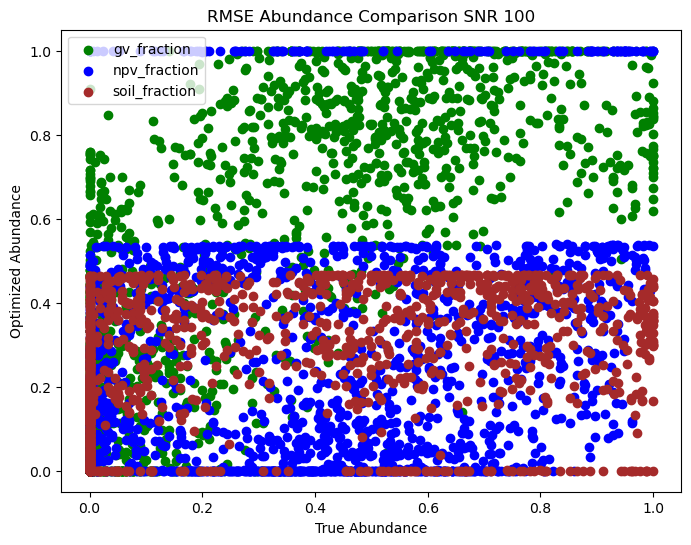

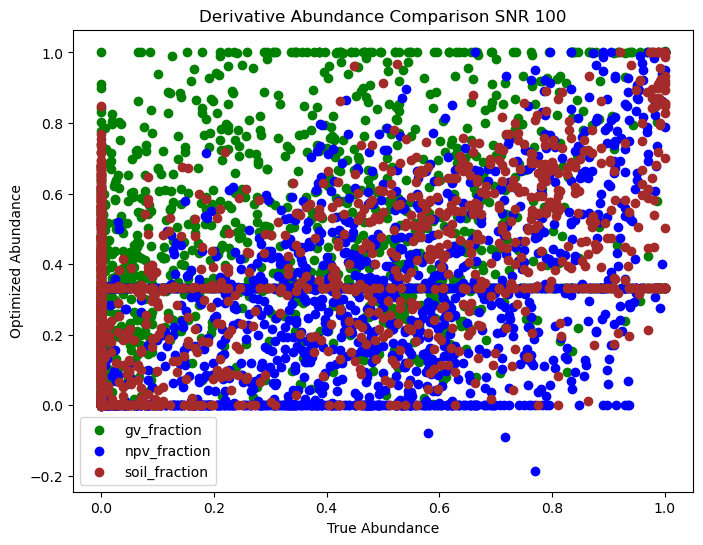

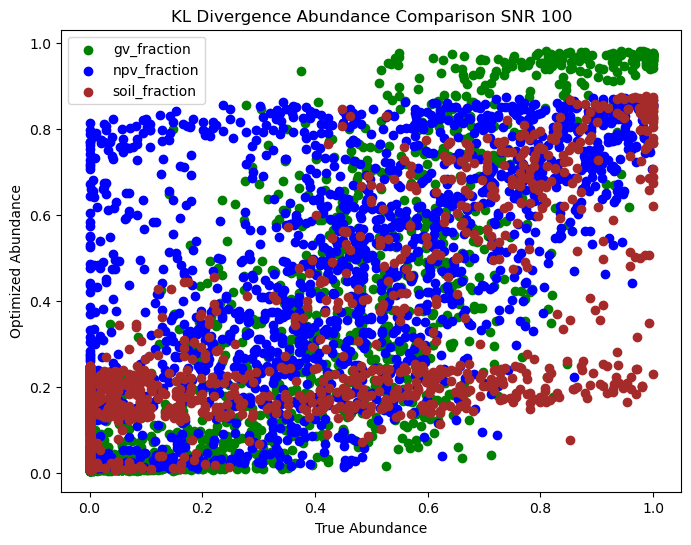

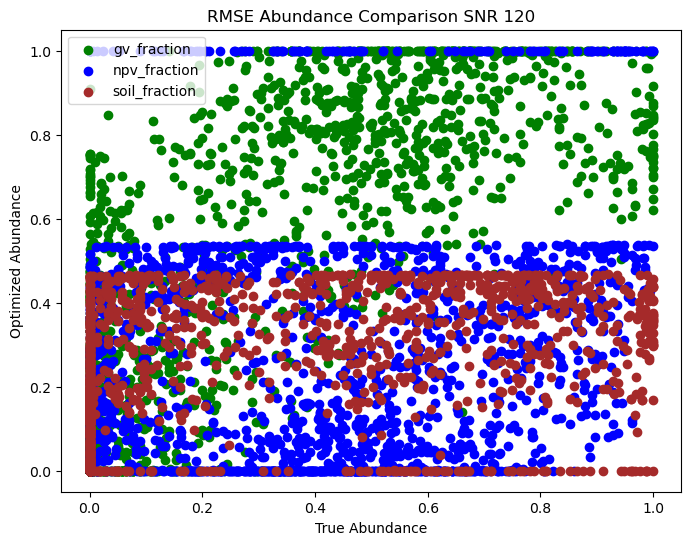

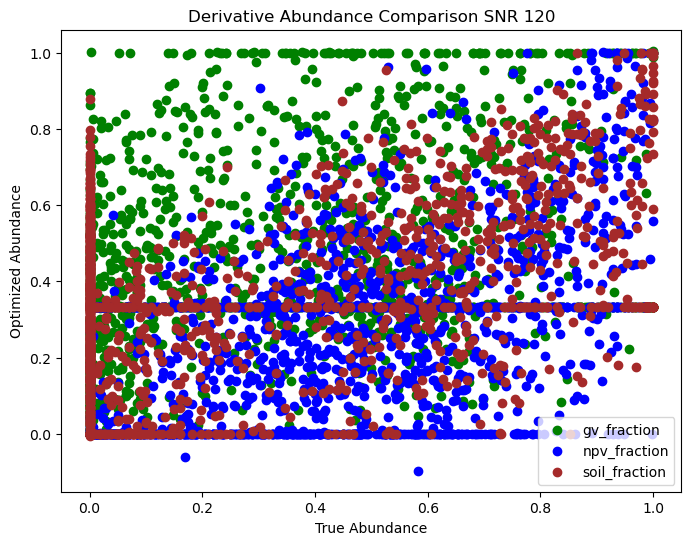

...

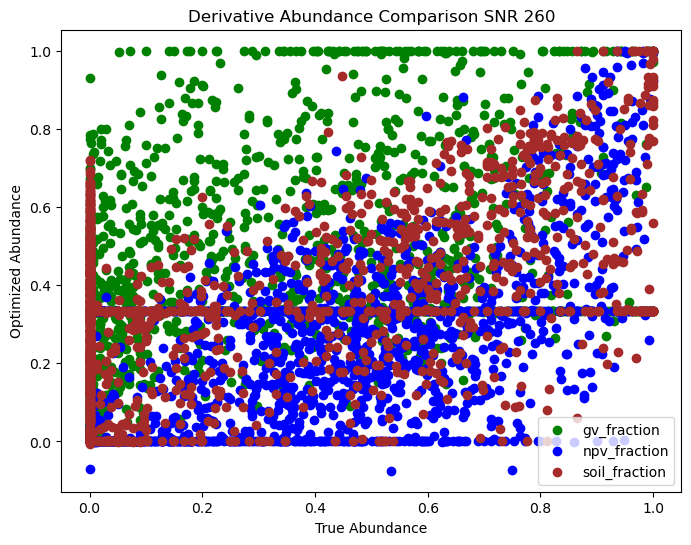

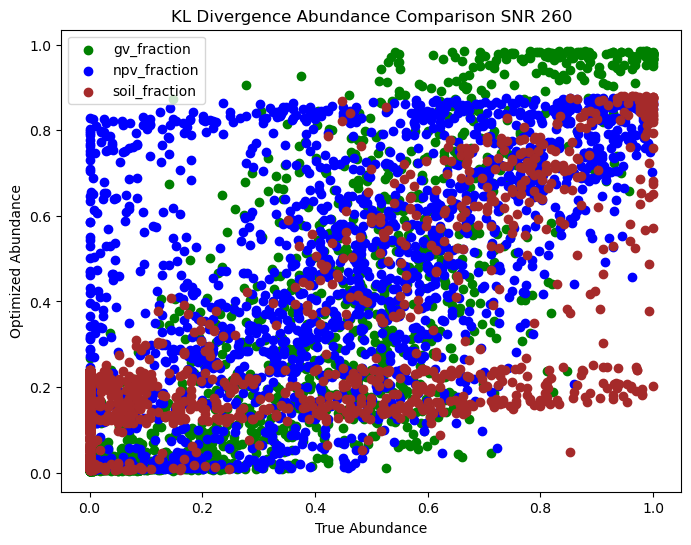

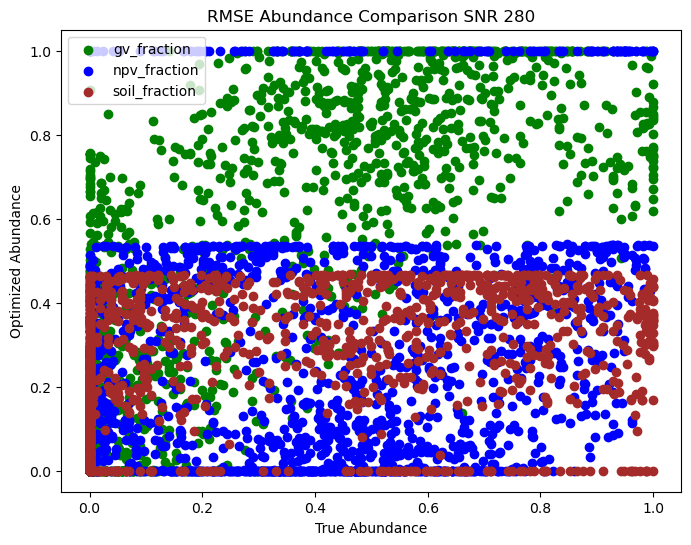

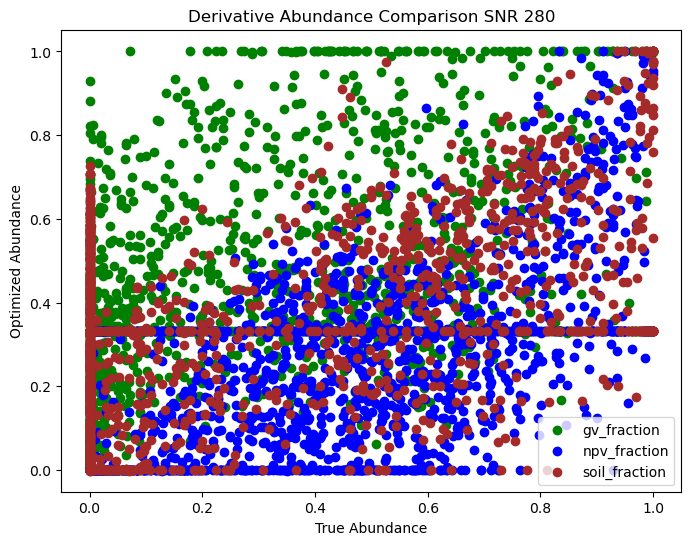

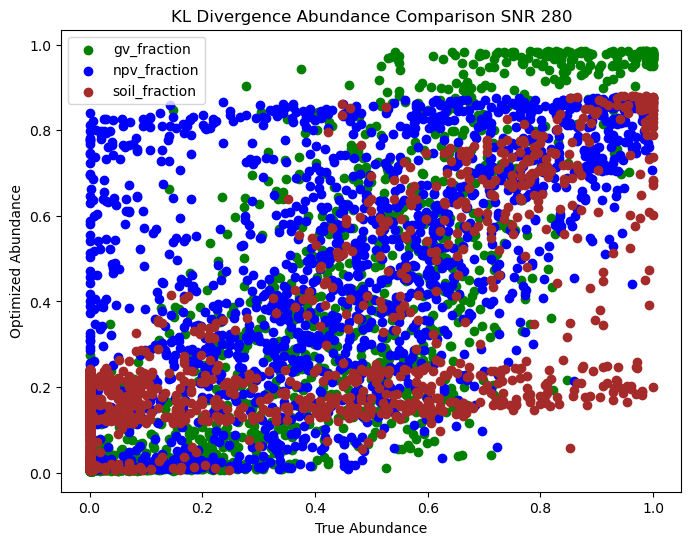

In [108]:
# Now, we plot results, do some analysis...

def plot_abundance_comparison(true_ab_df: pd.DataFrame, optimized_ab_df: pd.DataFrame, title: str = "Abundance Comparison"):
    """
    Creates a scatter plot comparing optimized abundance (y-axis) with true abundances (x-axis).
    """
    types = ['gv_fraction', 'npv_fraction', 'soil_fraction']
    colors = ['green', 'blue', 'brown']
    # Create a scatter plot for each column (abundance type)
    fig, ax = plt.subplots(figsize=(8, 6))
    
    for column in optimized_ab_df.columns:
        ax.scatter(true_ab_df[column], optimized_ab_df[column], label=types[column], color=colors[column])
    
    ax.set_ylabel('Optimized Abundance')
    ax.set_xlabel('True Abundance')
    ax.set_title(title)
    ax.legend()

    plt.show()

def plot_single_abundance_comparison(abundance_type: int, true_ab_df: pd.DataFrame, optimized_ab_df: pd.DataFrame, title: str = "Abundance Comparison"):
    """
    Creates a scatter plot comparing optimized abundance (y-axis) with true abundances (x-axis).
    """

    types = ['gv_fraction', 'npv_fraction', 'soil_fraction']
    colors = ['green', 'blue', 'brown']
    
    # Create a scatter plot for each column (abundance type)
    fig, ax = plt.subplots(figsize=(8, 6))
    
    ax.scatter(optimized_ab_df[abundance_type], true_ab_df[abundance_type], label=types[abundance_type], color=colors[abundance_type])
    
    ax.set_xlabel('Optimized Abundance')
    ax.set_ylabel('True Abundance')
    ax.set_title(title)
    ax.legend()

    plt.show()

for i in [100,120,140,160,180,200,220,240,260,280]:
    plot_abundance_comparison(pd.DataFrame(globals()[f'abundances_library_SNR_{i}']), pd.DataFrame(globals()[f'abundances_RMSE_SNR_{i}']), title=f"RMSE Abundance Comparison SNR {i}")
    plot_abundance_comparison(pd.DataFrame(globals()[f'abundances_library_SNR_{i}']), pd.DataFrame(globals()[f'abundances_Derivative_SNR_{i}']), title=f"Derivative Abundance Comparison SNR {i}")
    plot_abundance_comparison(pd.DataFrame(globals()[f'abundances_library_SNR_{i}']), pd.DataFrame(globals()[f'abundances_KLDiv_SNR_{i}']), title=f"KL Divergence Abundance Comparison SNR {i}")